In [3]:
%matplotlib widget
import os,sys
import csv
import copy
import math
import collections
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from clawpack import pyclaw
from clawpack import riemann
from IPython.display import HTML
import numpy as np
from scipy.integrate import simps, trapz
from scipy.interpolate import interp1d
from scipy import signal
sys.path.append("/pymorph")
from schemes.weno import get_left_flux,get_right_flux, get_Max_Phase_Speed
from schemes.weno import get_stencil
import sediment_transport.sed_trans as sedtrans
import morph_geom_lib as mgl

from models.shallow_water_solver import shallow_water_solver
from schemes.avalanche_scheme import *

from matplotlib.collections import LineCollection
from mpl_toolkits.mplot3d import Axes3D

from IPython.display import display, Math, Latex
from matplotlib import animation, rc

rc('animation', html='html5')

%load_ext autoreload
%autoreload 2
%matplotlib inline
plt.style.use(['default'])

Z: 87
0.01569138276553106


Text(0, 0.5, 'z (m)')

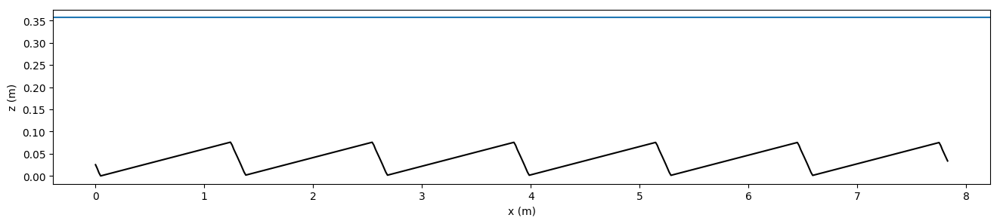

In [4]:
profile_folder = '/pymorph/notebooks/Paper_3/flume_profile_smoothed_v002.txt'
xc, z0 = mgl.readQueensFlume(profile_folder,1)

fig = plt.figure(figsize=(16, 3))
#plt.plot(xc,z0,'b')

dunes = 6

xsaw = np.linspace(0, 1,500)
simTime = 60*10 # Runtime in seconds
dt = 0.5 # Time step size (s)

zsaw = 0.076*(signal.sawtooth(2*dunes*np.pi * xsaw) + 1.)/2
xsaw = xsaw*xc.max()*dunes*0.5
#plt.plot(xsaw,zsaw)


dx = xsaw[1]-xsaw[0]
znew, iterations1 = avalanche_model(dx,xsaw, zsaw, adjustment_angle=28.)
# Now flip it to run in reverse
zflip = np.flip(znew, axis=0)
zflip, iterations1 = avalanche_model(dx,xsaw, zflip, adjustment_angle=28.)
znew = np.flip(zflip, axis=0)

znew = (znew - np.min(znew))/np.ptp(znew)
znew = znew*0.076

plt.plot(xsaw,znew,'-',color='k')
plt.axhline(0.357)
print(dx)
plt.xlabel('x (m)')
plt.ylabel('z (m)')

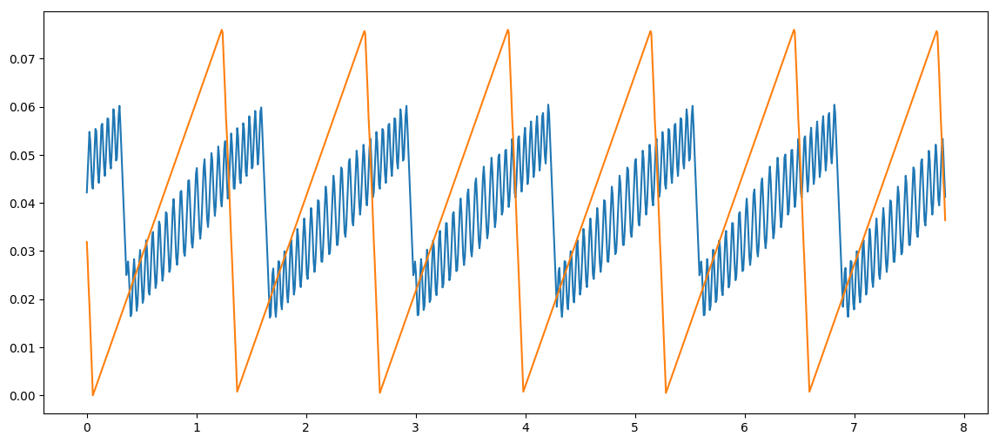

In [3]:
#--------------------------------
# Set up the constants
#--------------------------------
xc = xsaw.copy()
zc = znew.copy()
x0 = xsaw.copy()
z0 = znew.copy()

nP=0.4
Slope = 1.26/1000 # Based on table 4.1 in Wiebe
mannings = 0.0248
beta = 0.01

D50 = 0.001

nx = len(xc)
# 32 cm Case 
Qc132 = 0.045
Qc120 = 0.020
B = 0.76
Qtotal32 = Qc132 * 3.
Qtotal20 = Qc120 * 3.
q32cm = Qtotal32 / B
q20cm = Qtotal20 / B

#sws.set_boundary_conditions()
surf = 0.357
Qin = q32cm

#--------------------------------
#  Setup the model run parameters
#--------------------------------
#simTime = 60*20 # Runtime in seconds
#dt = 0.25 # Time step size (s)
extractionInterval = 60.*1
nt = int(simTime/dt)  # Number of time st

qbedload = np.zeros(len(xc))
cntr = 0
#--------------------------------
#  Run the model
#--------------------------------
time_series = collections.OrderedDict()
time = 0
for n in range(1,nt):  
    zn = zc.copy() 
        
    # Need the sign of the phase speed
    # Need to check this out
    for i in range(0,nx): #i=2       
        qloc = get_stencil(qbedload,i-1,i+2)  
        zc[i] = zn[i]-(1./(1.-nP))*dt/(dx*2.)*(qloc[2] - qloc[0])
        #zc[i] = zn[i]-(1./(1.-nP))*(dt/dx)*(qloc[1] - qloc[0])
    
    bed_max_delta = np.max(np.abs(zn - zc))
    
    # Apply the avalanche model
    zc, iterations1 = avalanche_model(dx,xc, zc, adjustment_angle=28.)
    # Now flip it to run in reverse
    zflip = np.flip(zc, axis=0)
    zflip, iterations1 = avalanche_model(dx,xc, zflip, adjustment_angle=28.)
    zc = np.flip(zflip, axis=0)
        
    slope = np.gradient(zc,dx)
    
    for i in range(0,nx): #i=2 
        a = 0.001
        b=3.0
        u = Qin/(surf-zc[i])
        qbedload[i] = (a *u**b) 
        
    time_series[time]=zc.copy()
    time+=1
        

fig = plt.figure(figsize=(14, 6))
plt.plot(xc,zc)
plt.plot(x0,z0)

2019-05-01 16:09:05,601 INFO CLAW: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2019-05-01 16:09:05,604 INFO CLAW: MovieWriter.run: running command: ['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '1200x300', '-pix_fmt', 'rgba', '-r', '333.3333333333333', '-loglevel', 'quiet', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', '/tmp/tmptcqncwt4/temp.m4v']


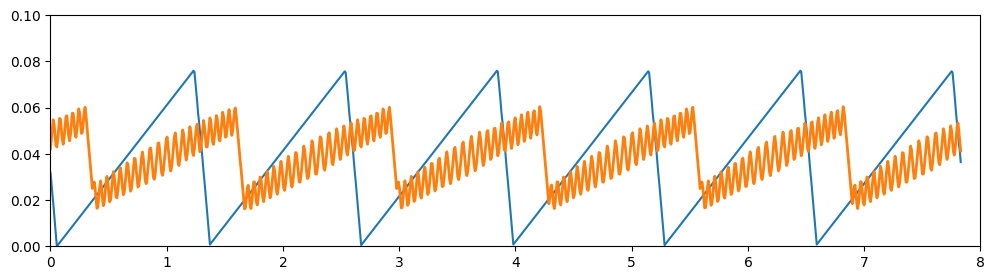

In [4]:
# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure(figsize=(12, 3))
ax = plt.axes(xlim=(0, 8), ylim=(0, 0.1))
plt.plot(x0,z0)
line, = ax.plot([], [], lw=2)

# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    return line,

# animation function.  This is called sequentially
def animate(i):
    x = xc
    y = time_series[i]
    line.set_data(x, y)
    return line,
# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=time, interval=3, blit=True)
HTML(anim.to_html5_video())






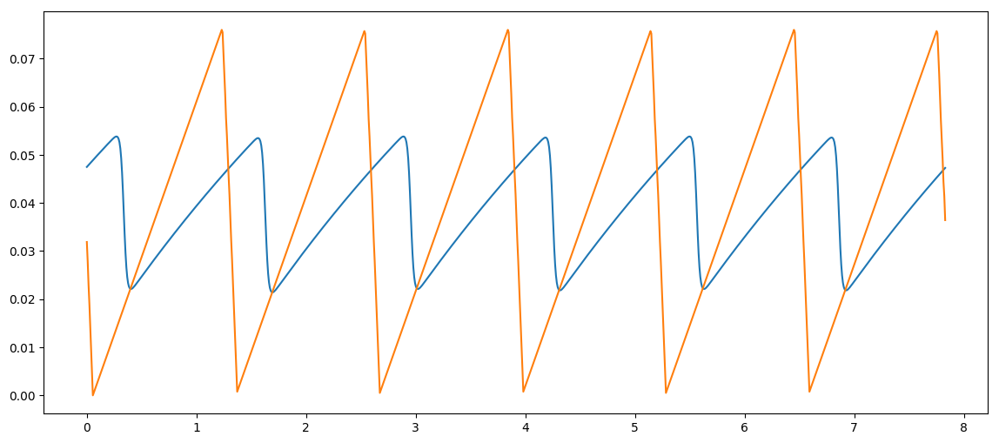

In [5]:
#--------------------------------
# Set up the constants
#--------------------------------
xc = xsaw.copy()
zc = znew.copy()
x0 = xsaw.copy()
z0 = znew.copy()

nP=0.4
Slope = 1.26/1000 # Based on table 4.1 in Wiebe
mannings = 0.0248
beta = 0.01

D50 = 0.001

nx = len(xc)
# 32 cm Case 
Qc132 = 0.045
Qc120 = 0.020
B = 0.76
Qtotal32 = Qc132 * 3.
Qtotal20 = Qc120 * 3.
q32cm = Qtotal32 / B
q20cm = Qtotal20 / B

#sws.set_boundary_conditions()
surf = 0.357
Qin = q32cm

#--------------------------------
#  Setup the model run parameters
#--------------------------------
#simTime = 60*20 # Runtime in seconds
#dt = 0.5 # Time step size (s)
extractionInterval = 60.*1
nt = int(simTime/dt)  # Number of time st

qbedload = np.zeros(len(xc))
cntr = 0

time_series = collections.OrderedDict()
time = 0
#--------------------------------
#  Run the model
#--------------------------------
for n in range(1,nt):  
    zn = zc.copy() 
    alpha = np.zeros(nx)
    # Need the sign of the phase speed
    # Need to check this out
    for i in range(0,nx): #i=2       
        zloc = get_stencil(zn,i-2,i+4)
        qloc = get_stencil(qbedload,i-2,i+4)
        if len(qloc)!=6:
            raise ValueError('Stencil is incorrect')
 
        # Determine the Upwind flux
        # The 0.5 comes from the c+abs(c) which is 2 if the wave speed is +ive
        # this is the evaluation of the left and right based fluxes. Eq. 18 and 19        
        if (zloc[3]-zloc[2]) == 0.0:
            alpha[i]=np.sign( (qloc[3]-qloc[2]) )
        else:
            alpha[i]=np.sign( (qloc[3]-qloc[2])/ (zloc[3]-zloc[2]) )
        
        
        
        qloc = get_stencil(qbedload,i-1,i+2)  
        #zc[i] = zn[i]-(1./(1.-nP))*dt/(dx*2.)*(qloc[2] - qloc[0])
        zc[i] = zn[i]-(1./(1.-nP))*(dt/dx)*0.5*( (1+alpha[i])*(qloc[1] - qloc[0])  + (1 - alpha[i])*(qloc[2] - qloc[1]))
    
    bed_max_delta = np.max(np.abs(zn - zc))
    
    # Apply the avalanche model
    zc, iterations1 = avalanche_model(dx,xc, zc, adjustment_angle=28.)
    # Now flip it to run in reverse
    zflip = np.flip(zc, axis=0)
    zflip, iterations1 = avalanche_model(dx,xc, zflip, adjustment_angle=28.)
    zc = np.flip(zflip, axis=0)
        
    slope = np.gradient(zc,dx)
    
    for i in range(0,nx): #i=2 
        a = 0.001
        b= 3.0
        u = Qin/(surf-zc[i])
        qbedload[i] = (a *u**b)
        
    time_series[time] = zc
    time+=1
        

fig = plt.figure(figsize=(14, 6))
plt.plot(xc,zc)
plt.plot(x0,z0)

2019-05-01 16:15:03,390 INFO CLAW: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2019-05-01 16:15:03,391 INFO CLAW: MovieWriter.run: running command: ['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '1200x300', '-pix_fmt', 'rgba', '-r', '333.3333333333333', '-loglevel', 'quiet', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', '/tmp/tmpf8n4pd_k/temp.m4v']


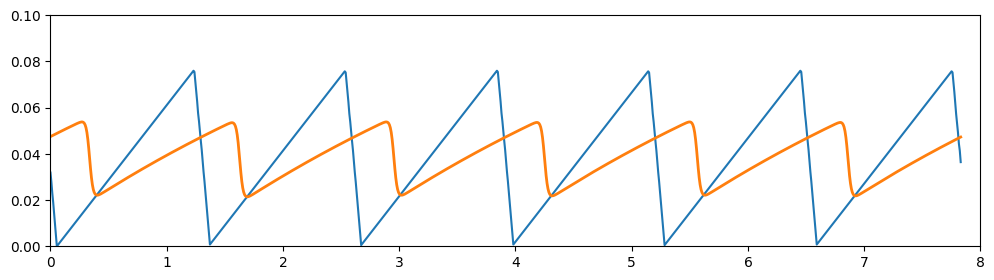

In [6]:
# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure(figsize=(12, 3))
ax = plt.axes(xlim=(0, 8), ylim=(0, 0.1))
plt.plot(x0,z0)
line, = ax.plot([], [], lw=2)

# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    return line,

# animation function.  This is called sequentially
def animate(i):
    x = xc
    y = time_series[i]
    line.set_data(x, y)
    return line,
# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=time, interval=3, blit=True)
HTML(anim.to_html5_video())

320.43435940000927
Courant Number: 0.053626831712467786


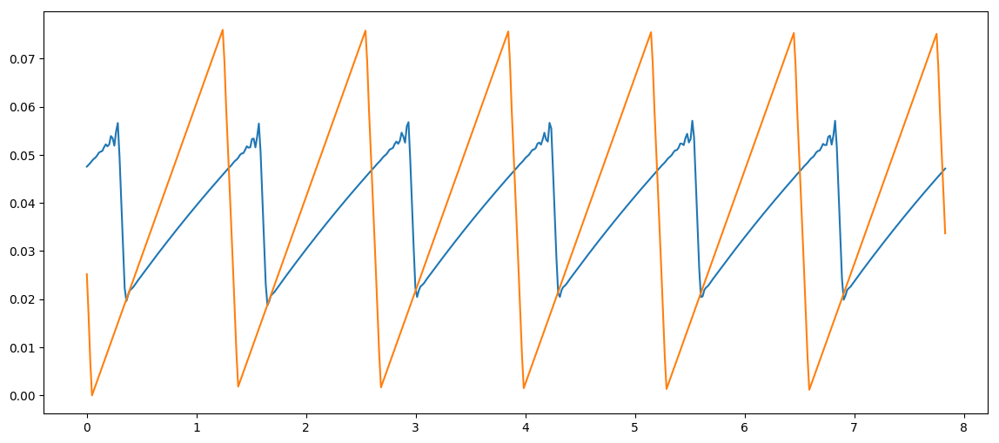

In [47]:
#--------------------------------
# Set up the constants
#--------------------------------
xc = xsaw.copy()
zc = znew.copy()
x0 = xsaw.copy()
z0 = znew.copy()

nP=0.4
Slope = 1.26/1000 # Based on table 4.1 in Wiebe
mannings = 0.0248
beta = 0.01

D50 = 0.001

nx = len(xc)
# 32 cm Case 
Qc132 = 0.045
Qc120 = 0.020
B = 0.76
Qtotal32 = Qc132 * 3.
Qtotal20 = Qc120 * 3.
q32cm = Qtotal32 / B
q20cm = Qtotal20 / B

#sws.set_boundary_conditions()
surf = 0.357
Qin = q32cm

#--------------------------------
#  Setup the model run parameters
#--------------------------------
simTime = 60*10 # Runtime in seconds
dt = 0.25 # Time step size (s)
extractionInterval = 60.*1
nt = int(simTime/dt)  # Number of time st

qbedload = np.zeros(len(xc))
cntr = 0

time_series = collections.OrderedDict()
time = 0

from timeit import default_timer as timer
start = timer()

#--------------------------------
#  Run the model
#--------------------------------
for n in range(1,nt):  
    zn = zc.copy() 
    roe_speed = np.zeros(nx)
    flux = np.zeros(nx)
    # Need the sign of the phase speed
    # Need to check this out
    for i in range(0,nx): #i=2       
        zloc = get_stencil(zn,i-2,i+4)
        #print xloc
        #raise ValueError()
        
        # Since k=3
        # stencil is i-2 to i+2 
        qloc = get_stencil(qbedload,i-2,i+4)
        if len(qloc) != 6:
            raise ValueError('Stencil is incorrect')
 
        #f_left,f_right = ENO(xloc,qloc,k)
        #f_left,f_right = WENO(xloc,qloc,k)
        
        
        #upwind flux
        # The 0.5 comes from the c+abs(c) which is 2 if the wave speed is +ive
        # this is the evaluation of the left and right based fluxes. Eq. 18 and 19
        
        if (zloc[3]-zloc[2]) == 0.0:
            roe_speed[i]=np.sign( (qloc[3]-qloc[2]) )
        else:
            roe_speed[i]=np.sign( (qloc[3]-qloc[2])/ (zloc[3]-zloc[2]) )
        
        if roe_speed[i] >= 0.0:
            flux[i] = get_left_flux(qloc)
        else:
            flux[i] = get_right_flux(qloc)
        
    # Need the sign of the phase speed
    # Need to check this out

    for i in range(0,nx): #i=2       
        floc = get_stencil(flux,i-1,i+1)
        # This is essentially eq. 8. 
        zc[i] = zn[i]-(1./(1.-nP))*(dt/(1.0*dx))*(floc[1]-floc[0])
    
    bed_max_delta = np.max(np.abs(zn - zc))
    
    # Apply the avalanche model
    zc, iterations1 = avalanche_model(dx,xc, zc, adjustment_angle=28.)
    # Now flip it to run in reverse
    zflip = np.flip(zc, axis=0)
    zflip, iterations1 = avalanche_model(dx,xc, zflip, adjustment_angle=28.)
    zc = np.flip(zflip, axis=0)
        
    slope = np.gradient(zc,dx)
    
    for i in range(0,nx): #i=2 
        a = 0.001
        b= 3.0
        u = Qin/(surf-zc[i])
        qbedload[i] = (a *u**b) 
        
    time_series[time] = zc
    time+=1
        
        
end = timer()
print(end - start) # Time in seconds, e.g. 5.38091952400282

fig = plt.figure(figsize=(14, 6))
plt.plot(xc,zc)
Co = get_Max_Phase_Speed(qbedload,zc,nP)*dt/dx

print('Courant Number: {0}'.format(Co))



plt.plot(x0,z0)

2019-05-01 19:58:10,711 INFO CLAW: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2019-05-01 19:58:10,713 INFO CLAW: MovieWriter.run: running command: ['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '1200x300', '-pix_fmt', 'rgba', '-r', '333.3333333333333', '-loglevel', 'quiet', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', '/tmp/tmp3a1wfr01/temp.m4v']


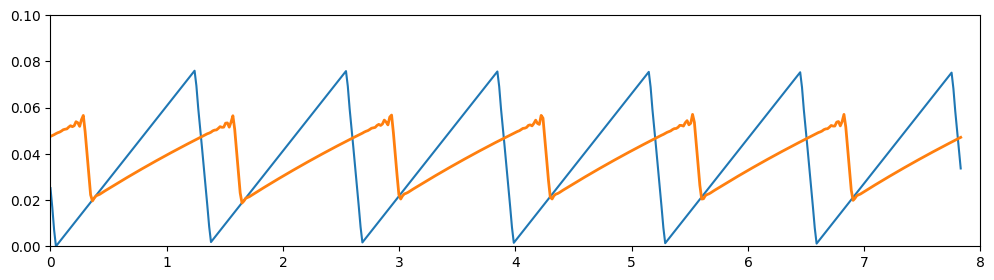

In [49]:
# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure(figsize=(12, 3))
ax = plt.axes(xlim=(0, 8), ylim=(0, 0.1))
plt.plot(x0,z0)
line, = ax.plot([], [], lw=2)

# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    return line,

# animation function.  This is called sequentially
def animate(i):
    x = xc
    y = time_series[i]
    line.set_data(x, y)
    return line,
# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=time, interval=3, blit=True)
HTML(anim.to_html5_video())

2320.4200127999648


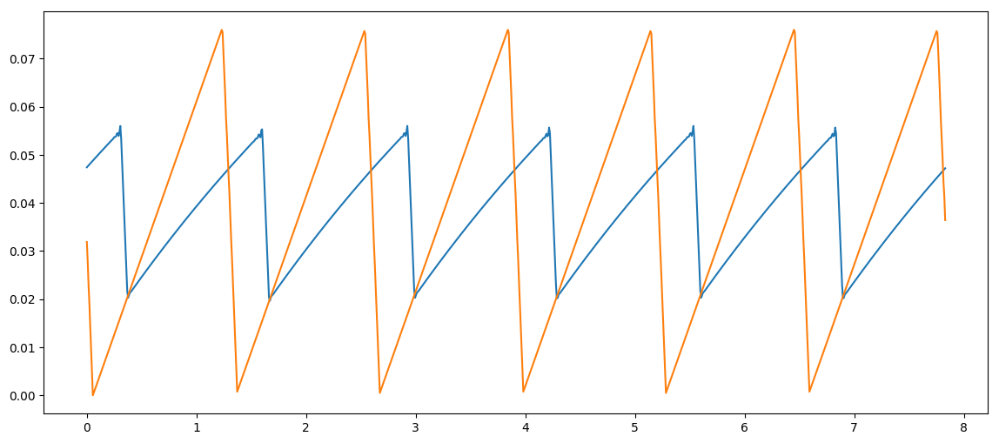

In [44]:
#--------------------------------
# Set up the constants
#--------------------------------
xc = xsaw.copy()
zc = znew.copy()
x0 = xsaw.copy()
z0 = znew.copy()

nP=0.4
Slope = 1.26/1000 # Based on table 4.1 in Wiebe
mannings = 0.0248
beta = 0.01

D50 = 0.001

nx = len(xc)
# 32 cm Case 
Qc132 = 0.045
Qc120 = 0.020
B = 0.76
Qtotal32 = Qc132 * 3.
Qtotal20 = Qc120 * 3.
q32cm = Qtotal32 / B
q20cm = Qtotal20 / B

#sws.set_boundary_conditions()
surf = 0.357
Qin = q32cm

#--------------------------------
#  Setup the model run parameters
#--------------------------------
simTime = 60*10 # Runtime in seconds
#dt = 0.5 # Time step size (s)
extractionInterval = 60.*1
nt = int(simTime/dt)  # Number of time st

qbedload = np.zeros(len(xc))
cntr = 0

time_series = collections.OrderedDict()
time = 0

from timeit import default_timer as timer
start = timer()

#--------------------------------
#  Run the model
#--------------------------------
for n in range(1,nt):  
    zn = zc.copy() 
    znp1  = zc.copy() 
    znp12  = zc.copy() 
    znp2  = zc.copy() 
    znp32  = zc.copy() 
    roe_speed = np.zeros(nx)
    flux = np.zeros(nx)
    ## Step 1
    for i in range(0,nx): 
        zloc = get_stencil(zn,i-2,i+4)
        qloc = get_stencil(qbedload,i-2,i+4)
        #upwind flux
        # The 0.5 comes from the c+abs(c) which is 2 if the wave speed is +ive
        # this is the evaluation of the left and right based fluxes. Eq. 18 and 19
        
        if (zloc[3]-zloc[2]) == 0.0:
            roe_speed[i]=np.sign( (qloc[3]-qloc[2]) )
        else:
            roe_speed[i]=np.sign( (qloc[3]-qloc[2])/ (zloc[3]-zloc[2]) )
        
        if roe_speed[i] >= 0.0:
            flux[i] = get_left_flux(qloc)
        else:
            flux[i] = get_right_flux(qloc)

    for i in range(0,nx): #i=2       
        floc = get_stencil(flux,i-1,i+1)
        # This is essentially eq. 8. 
        znp1[i] = zn[i]-(1./(1.-nP))*(dt/(1.0*dx))*(floc[1]-floc[0])
        
    for i in range(0,nx): #i=2 
        a = 0.001
        b= 3.0
        u = Qin/(surf-znp1[i])
        qbedload[i] = (a *u**b)
        

    # -------------------------
    # Step 2
    # -------------------------
    for i in range(0,nx): 
        zloc = get_stencil(znp1,i-2,i+4)
        qloc = get_stencil(qbedload,i-2,i+4)
        #upwind flux
        # The 0.5 comes from the c+abs(c) which is 2 if the wave speed is +ive
        # this is the evaluation of the left and right based fluxes. Eq. 18 and 19
        
        if (zloc[3]-zloc[2]) == 0.0:
            roe_speed[i]=np.sign( (qloc[3]-qloc[2]) )
        else:
            roe_speed[i]=np.sign( (qloc[3]-qloc[2])/ (zloc[3]-zloc[2]) )
        
        if roe_speed[i] >= 0.0:
            flux[i] = get_left_flux(qloc)
        else:
            flux[i] = get_right_flux(qloc)

    for i in range(0,nx): #i=2       
        floc = get_stencil(flux,i-1,i+1)
        # This is essentially eq. 8. 
        znp2[i] = znp1[i]-(1./(1.-nP))*(dt/(1.0*dx))*(floc[1]-floc[0])
        
    # -------------------------
    # Step 3
    # -------------------------
    znp12 = 0.75*zn + 0.25*znp2
    
    # Update the flow depth, velocity and bedload
    for i in range(0,nx): #i=2 
        a = 0.001
        b= 3.0
        u = Qin/(surf-znp12[i])
        qbedload[i] = (a *u**b)
        
    
    # -------------------------
    # Step 4
    # -------------------------
    for i in range(0,nx): 
        zloc = get_stencil(znp12,i-2,i+4)
        qloc = get_stencil(qbedload,i-2,i+4)
        #upwind flux
        # The 0.5 comes from the c+abs(c) which is 2 if the wave speed is +ive
        # this is the evaluation of the left and right based fluxes. Eq. 18 and 19
        
        if (zloc[3]-zloc[2]) == 0.0:
            roe_speed[i]=np.sign( (qloc[3]-qloc[2]) )
        else:
            roe_speed[i]=np.sign( (qloc[3]-qloc[2])/ (zloc[3]-zloc[2]) )
        
        if roe_speed[i] >= 0.0:
            flux[i] = get_left_flux(qloc)
        else:
            flux[i] = get_right_flux(qloc)

    for i in range(0,nx): #i=2       
        floc = get_stencil(flux,i-1,i+1)
        # This is essentially eq. 8. 
        znp32[i] = znp12[i]-(1./(1.-nP))*(dt/(1.0*dx))*(floc[1]-floc[0])
        
    # -------------------------
    # Step 5
    # -------------------------
    zc = (1./3.)*zn + (2./3.)*znp32
        
    # Update the flow depth, velocity and bedload
    for i in range(0,nx): #i=2 
        a = 0.001
        b= 3.0
        u = Qin/(surf-zc[i])
        qbedload[i] = (a *u**b)
    
    # Apply the avalanche model
    zc, iterations1 = avalanche_model(dx,xc, zc, adjustment_angle=28.)
    # Now flip it to run in reverse
    zflip = np.flip(zc, axis=0)
    zflip, iterations1 = avalanche_model(dx,xc, zflip, adjustment_angle=28.)
    zc = np.flip(zflip, axis=0)
        

        
    time_series[time] = zc
    time+=1
        
        
end = timer()
print(end - start) # Time in seconds, e.g. 5.38091952400282


fig = plt.figure(figsize=(14, 6))
plt.plot(xc,zc)
plt.plot(x0,z0)

2019-05-01 19:32:24,108 INFO CLAW: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2019-05-01 19:32:24,110 INFO CLAW: MovieWriter.run: running command: ['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '1200x300', '-pix_fmt', 'rgba', '-r', '333.3333333333333', '-loglevel', 'quiet', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', '/tmp/tmpdzb49mc5/temp.m4v']


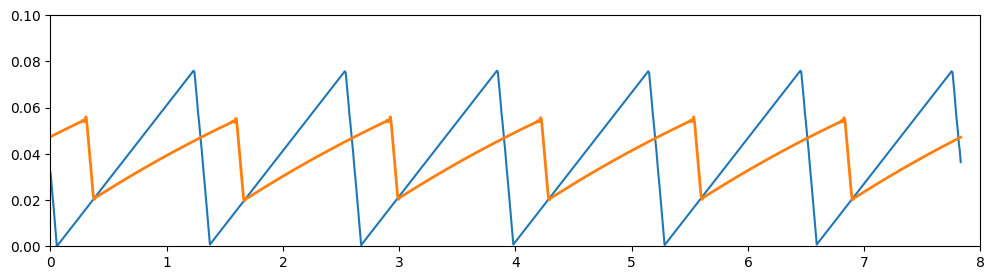

In [45]:
# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure(figsize=(12, 3))
ax = plt.axes(xlim=(0, 8), ylim=(0, 0.1))
plt.plot(x0,z0)
line, = ax.plot([], [], lw=2)

# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    return line,

# animation function.  This is called sequentially
def animate(i):
    x = xc
    y = time_series[i]
    line.set_data(x, y)
    return line,
# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=time, interval=3, blit=True)
HTML(anim.to_html5_video())

# MacCormack Scheme

85.68838909995975


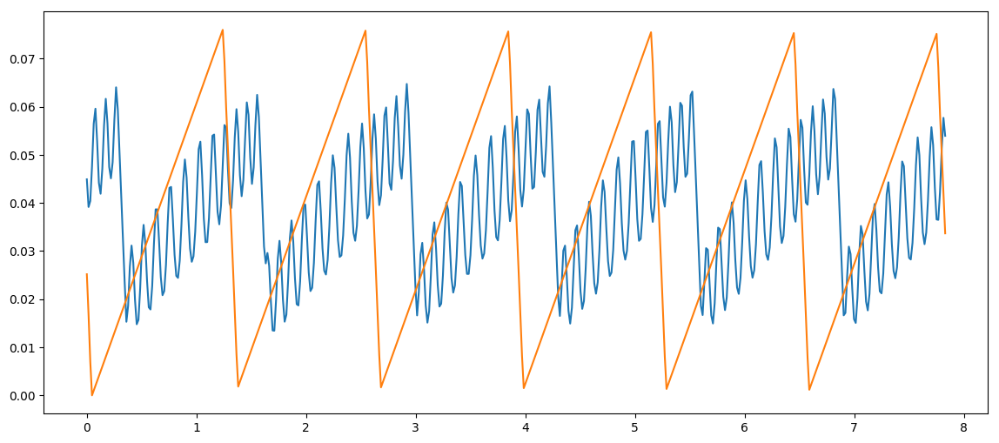

In [5]:
#--------------------------------
# Set up the constants
#--------------------------------
xc = xsaw.copy()
zc = znew.copy()
x0 = xsaw.copy()
z0 = znew.copy()

nP=0.4
Slope = 1.26/1000 # Based on table 4.1 in Wiebe
mannings = 0.0248
beta = 0.01

D50 = 0.001

nx = len(xc)
# 32 cm Case 
Qc132 = 0.045
Qc120 = 0.020
B = 0.76
Qtotal32 = Qc132 * 3.
Qtotal20 = Qc120 * 3.
q32cm = Qtotal32 / B
q20cm = Qtotal20 / B

#sws.set_boundary_conditions()
surf = 0.357
Qin = q32cm

#--------------------------------
#  Setup the model run parameters
#--------------------------------
simTime = 60*10 # Runtime in seconds
dt = 0.25 # Time step size (s)
extractionInterval = 60.*1
nt = int(simTime/dt)  # Number of time st

qbedload = np.zeros(len(xc))
cntr = 0

time_series = collections.OrderedDict()
time = 0

from timeit import default_timer as timer
start = timer()


for n in range(1,nt):  
    zn = zc.copy() 
    zhatn = zc.copy() 
    alpha = np.zeros(nx)
        
    # Need the sign of the phase speed
    # Need to check this out
      
    for i in range(0,nx): #i=2       
        qloc = get_stencil(qbedload,i-1,i+2)  
        zhatn[i] = zn[i]-(1./(1.-nP))*dt/(dx)*(qloc[1] - qloc[0])
        
    # Update the flow depth, velocity and bedload
    for i in range(0,nx): #i=2 
        a = 0.001
        b= 3.0
        u = Qin/(surf-zc[i])
        qbedload[i] = (a *u**b)
        
    for i in range(0,nx): #i=2       
        qloc = get_stencil(qbedload,i-1,i+2)  
        zc[i] = 0.5*(zhatn[i]+zn[i]) - (1/(1.-nP))*dt/(dx*2.)*(qloc[2] - qloc[1])
        
    
    # Apply the avalanche model
    zc, iterations1 = avalanche_model(dx,xc, zc, adjustment_angle=28.)
    # Now flip it to run in reverse
    zflip = np.flip(zc, axis=0)
    zflip, iterations1 = avalanche_model(dx,xc, zflip, adjustment_angle=28.)
    zc = np.flip(zflip, axis=0)
        
    
    bed_max_delta = np.max(np.abs(zn - zc))

    # Update the flow depth, velocity and bedload
    for i in range(0,nx): #i=2 
        a = 0.001
        b= 3.0
        u = Qin/(surf-zc[i])
        qbedload[i] = (a *u**b)
    
    
    time_series[time] = zc
    time+=1
    
        
end = timer()
print(end - start) # Time in seconds, e.g. 5.38091952400282

fig = plt.figure(figsize=(14, 6))
plt.plot(xc,zc)
plt.plot(x0,z0)

2019-05-02 02:04:13,278 INFO CLAW: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2019-05-02 02:04:13,280 INFO CLAW: MovieWriter.run: running command: ['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '1200x300', '-pix_fmt', 'rgba', '-r', '200.0', '-loglevel', 'quiet', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', '/tmp/tmpi_mb655p/temp.m4v']


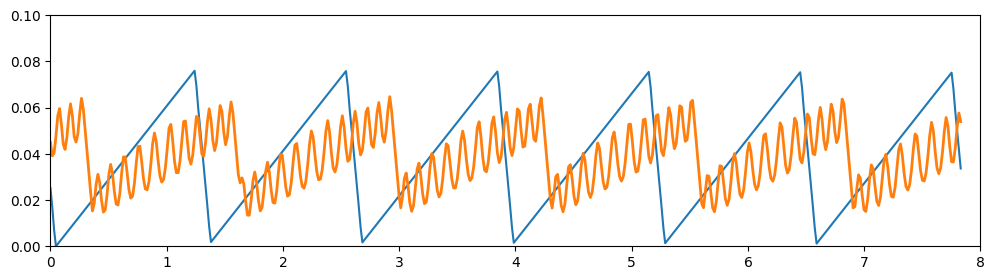

In [6]:
# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure(figsize=(12, 3))
ax = plt.axes(xlim=(0, 8), ylim=(0, 0.1))
plt.plot(x0,z0)
line, = ax.plot([], [], lw=2)

# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    return line,

# animation function.  This is called sequentially
def animate(i):
    x = xc
    y = time_series[i]
    line.set_data(x, y)
    return line,
# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=time, interval=15, blit=True)
HTML(anim.to_html5_video())

0.01569138276553106

In [53]:
HTML(anim.to_html5_video())

In [12]:
# Set up formatting for the movie files
FFwriter = animation.FFMpegWriter()
Writer = animation.writers['ffmpeg']
writer = Writer(fps=200, metadata=dict(artist='Me'), bitrate=1800)
anim.save('macormack.mp4',writer = writer)

2019-05-02 02:21:49,146 INFO CLAW: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2019-05-02 02:21:49,149 INFO CLAW: MovieWriter.run: running command: ['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '1200x300', '-pix_fmt', 'rgba', '-r', '200', '-loglevel', 'quiet', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-b', '1800k', '-metadata', 'artist=Me', '-y', 'macormack.mp4']


In [14]:
get_Max_Phase_Speed(qbedload,zc,nP)*dt/dx

0.05649993449078214